In [1]:
import scanpy as sc
import numpy as np
import pandas as pd

In [2]:
import os
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "2"

In [3]:
import torch
import os
from collections import Counter
import sklearn
import psutil
import numpy as np
import time
from loguru import logger

import pandas as pd
# import scanpy as sc
from tqdm import tqdm
import random
import sys
import multiprocessing
import anndata as ad
import gc
import pickle
# from torch.nn.utils.rnn import pad_sequence

root_path = os.path.abspath('/home/chenyx/scMulan/cellgpt_v1/')
sys.path.append(os.path.abspath(root_path))

# from imp import reload
# reload(hf_tokenizer) # also reload(mymodule)

# from utils.hf_tokenizer import cellGenesisTokenizer

data_root_path = '/home/bianhaiyang/tmp_dataHub/datasets/'
dataset = 'ECA_GO'
dataPath = os.path.join(data_root_path,dataset)
assert os.path.exists(dataPath)
tmp_dataPath = os.path.join(dataPath,'tmp_files')

In [4]:
import tools.generation.convert_generation_to_gdata as cgdata

In [5]:
def get_binned_expression(row,n_expression_level):
    max_expr = row.max()
    bins = np.linspace(0, max_expr, n_expression_level + 1) # 生成10个bin的边界，所以是11个值 (n+1)
    binned_expr = np.digitize(row, bins, right=True) 
    return pd.Series(binned_expr/n_expression_level, index=row.index)

def convert_cellsentence_ele_to_df(cellGene_ele, n_expression_level, task = 'cs'):
    dfList = []
    ## fetch gene expression
    for c,e in tqdm(cellGene_ele):
        st = c.index(2207)+1
        c_list = tokenizer.convert_ids_to_tokens(c[st:-1])
        ele = e[st:-1]
        dfDict = {}
        for name,ele in zip(c_list,ele):
            dfDict[name] = ele/n_expression_level
        dfList.append(dfDict)
    gDF = pd.DataFrame(dfList).fillna(0)
    return gDF

In [6]:
def format_generation_to_adata(generation_path,cell_type):
    results_save_dirs = [generation_path+res_p for res_p in os.listdir(generation_path)]
    results_save_dirs.sort()
    logger.info('working path is',generation_path)
    all_results = {'idx': [], 'cgg': [], 'cge': []}
    
    logger.info('building dataframe')
    for path in tqdm(results_save_dirs):
        # 加载结果
        results = torch.load(path)
        # 将每个结果文件的内容添加到all_results字典
        for key, value in results.items():
            all_results[key].extend(value)
    
    cgg = all_results['cgg']
    cge = all_results['cge']
    
    gg_len = []
    for gg in cgg:
        gg_len.append(len(gg))
    plt.hist(np.array(gg_len),bins=50,)
    
    gDF = convert_cellsentence_ele_to_df(zip(cgg,cge),n_express_level)
    origin_columns = list(meta_info['gene_set'])
    missing_columns = list(set(origin_columns) - set(gDF.columns))
    logger.debug(f'missing column number is {len(missing_columns)}')
    missing_columns_data = pd.DataFrame(0, columns=missing_columns, index=gDF.index)
    gDF = pd.concat([gDF, missing_columns_data], axis=1)
    gDF = gDF.reindex(columns=origin_columns)
    gDF.index = gDF.index.astype(str) + '_generated'
    gDF = sc.AnnData(gDF.astype(float))
    gDF.obs['cell_type'] = cell_type
    return gDF

In [7]:
from model.model import GPTConfig, cellGPTModel
import torch.nn.functional as F
from model import model_kvcache

/data/chenyx/anaconda3/envs/scMulan/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [8]:
from utils.hf_tokenizer import cellGenesisTokenizer

In [9]:
import matplotlib.pyplot as plt

In [10]:
meta_info = torch.load(os.path.join(dataPath,'meta_info.pt'))
chars = meta_info['token_set']
tokenizer = cellGenesisTokenizer(chars)
n_express_level = 10

# Preprocessing adata

## load generated data

2024-11-11 17:01:21.257 | INFO     | __main__:format_generation_to_adata:4 - working path is
2024-11-11 17:01:21.260 | INFO     | __main__:format_generation_to_adata:7 - building dataframe
100%|██████████| 8/8 [00:00<00:00,  8.89it/s]
16200it [00:01, 14309.95it/s]
2024-11-11 17:01:26.269 | DEBUG    | __main__:format_generation_to_adata:26 - missing column number is 438


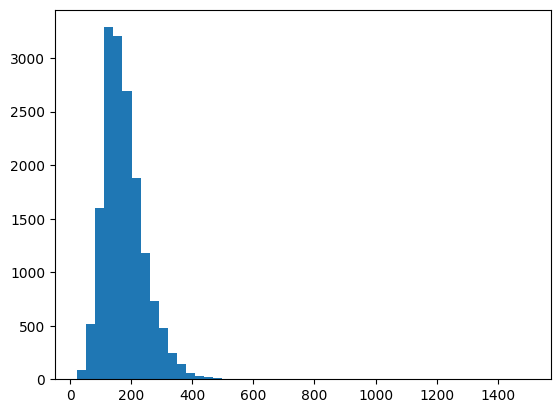

In [12]:
adata = format_generation_to_adata("/home/bianhaiyang/projects/cellgpt_v1/tmp_test/heca_experiments/inSilicoPerturb/generated_heart_vas_com/", "Vascular endothelial cell")

In [13]:
sc.pp.pca(adata)
sc.pp.neighbors(adata,n_pcs=15)
sc.tl.umap(adata)

/data/chenyx/anaconda3/envs/scMulan/lib/python3.9/site-packages/numba/np/ufunc/parallel.py:371: NumbaWarning: The TBB threading layer requires TBB version 2021 update 6 or later i.e., TBB_INTERFACE_VERSION >= 12060. Found TBB_INTERFACE_VERSION = 12050. The TBB threading layer is disabled.
  warnings.warn(problem)


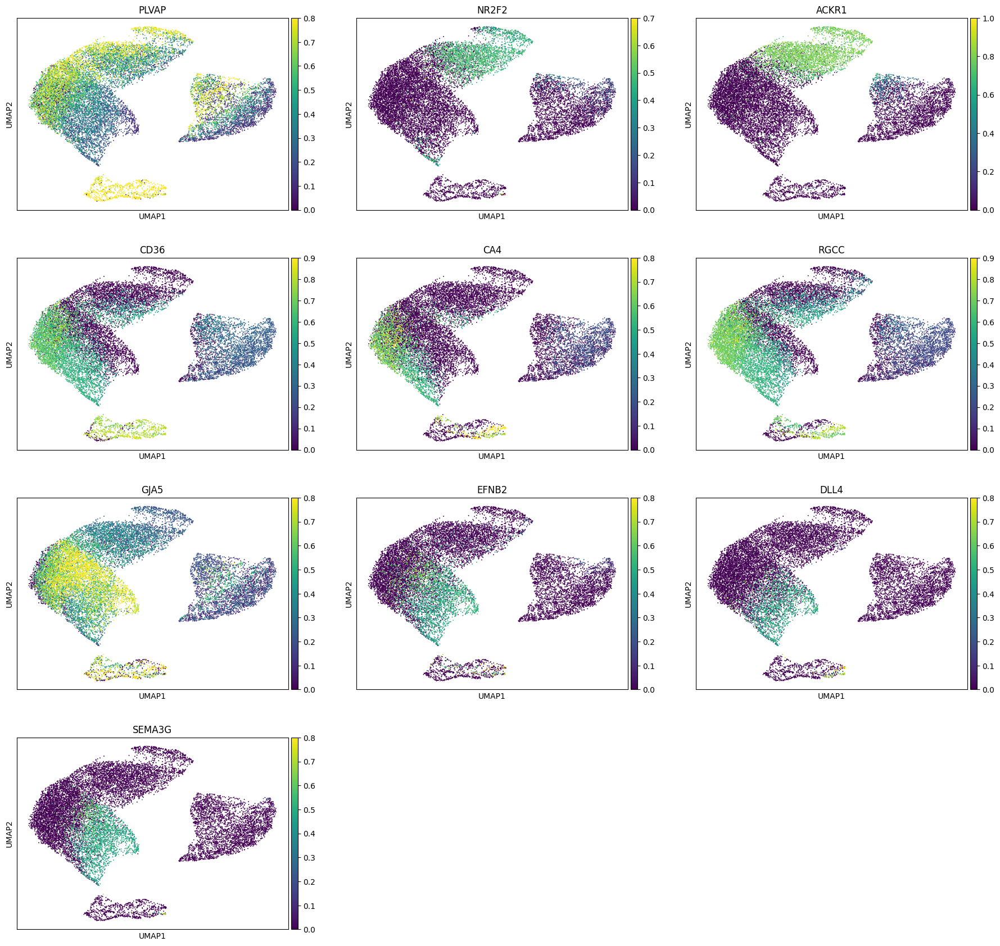

In [14]:
sc.pl.umap(adata, color=['PLVAP','NR2F2','ACKR1',#vEC
                         'CD36','CA4','RGCC',#cap
                         'GJA5','EFNB2','DLL4', 'SEMA3G'#aEC
                         ],ncols=3)

In [15]:
adata.obs['condition_GJA5'] = pd.Categorical(adata.X[:,adata.var.index=="GJA5"].reshape(-1))
adata.obs['condition_PLVAP'] = pd.Categorical(adata.X[:,adata.var.index=="PLVAP"].reshape(-1))

In [16]:
adata.var["mt"] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt"], percent_top=None, log1p=False, inplace=True
)

In [17]:
sc.tl.leiden(adata,resolution=0.1)

/data/chenyx/anaconda3/envs/scMulan/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/data/chenyx/anaconda3/envs/scMulan/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


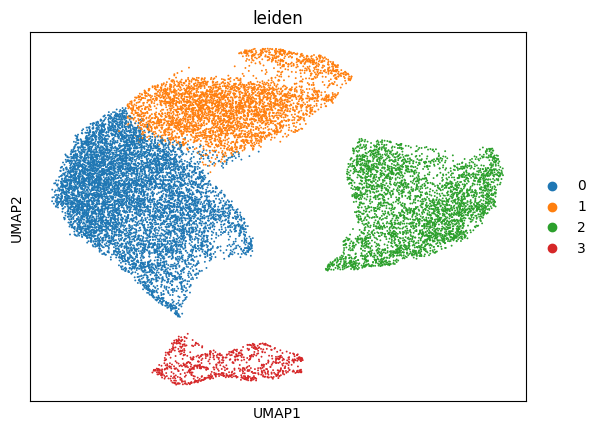

In [18]:
sc.pl.umap(adata, color="leiden")

In [19]:
adata.obs['batch'] = 'raw'
adata.obs['batch'][adata.obs.leiden.isin(["0","1"])] = '1'
adata.obs['batch'][adata.obs.leiden.isin(["2"])] = '2'
adata.obs['batch'][adata.obs.leiden.isin(["3"])] = '3'

/tmp/ipykernel_686175/1212849421.py:2: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  adata.obs['batch'][adata.obs.leiden.isin(["0","1"])] = '1'
/tmp/ipykernel_686175/1212849421.py:2: SettingWithCopyWarning: 
A value is trying to be set on a 

In [20]:
adata.obs['Cluster'] = adata.obs['batch']

/data/chenyx/anaconda3/envs/scMulan/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/data/chenyx/anaconda3/envs/scMulan/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


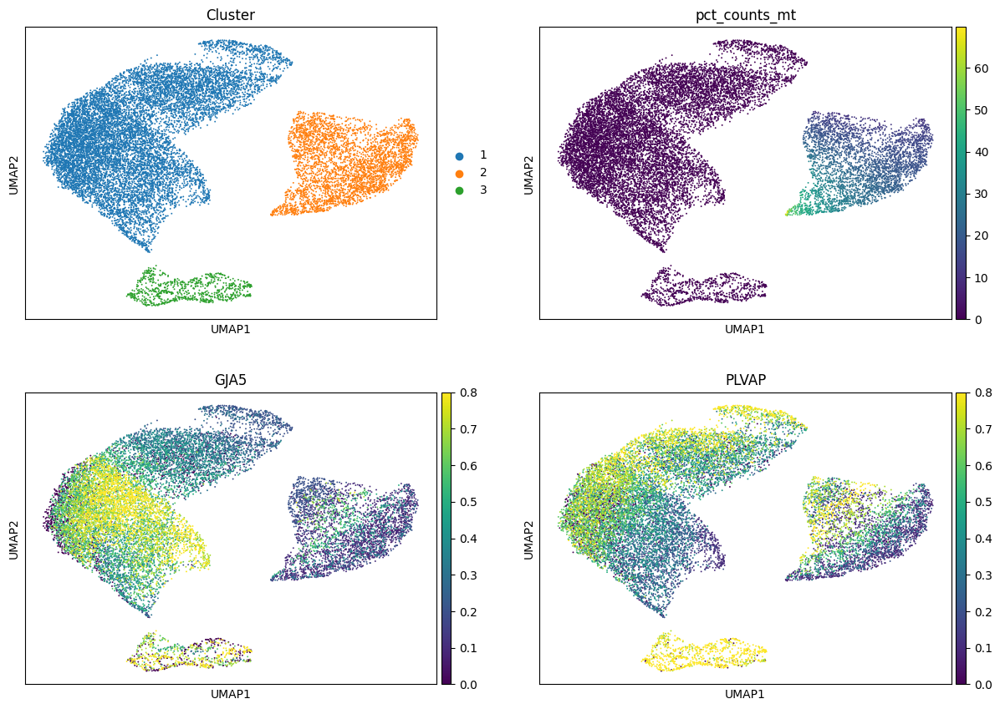

In [22]:
sc.pl.umap(adata, color=["Cluster","pct_counts_mt","GJA5","PLVAP"], ncols=2, save="Fig5.a.pdf")

## Merge conditional generation with un-conditional generation

In [ ]:
# we also generated some vascular endothelial cells without gene conditions (see Generation_raw_VEC.ipynb)
adata_raw = sc.read_h5ad("vascular_raw.h5ad")
adata_raw.obs['batch'] = 'raw'

/tmp/ipykernel_2580814/4104809193.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs['batch'][adata.obs.leiden.isin(["0","1"])] = '1'
/tmp/ipykernel_2580814/4104809193.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs['batch'][adata.obs.leiden.isin(["2"])] = '2'
/tmp/ipykernel_2580814/4104809193.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs['batch'][adata.obs.leiden.isin(["3"])] = '3'


In [6]:
adata_merge = sc.concat([adata,adata_raw])
sc.pp.pca(adata_merge)
sc.pp.neighbors(adata_merge, n_pcs=15)
sc.tl.umap(adata_merge)

/data/chenyx/anaconda3/envs/scMulan/lib/python3.9/site-packages/anndata/_core/anndata.py:1898: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/data/chenyx/anaconda3/envs/scMulan/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/data/chenyx/anaconda3/envs/scMulan/lib/python3.9/site-packages/numba/np/ufunc/parallel.py:371: NumbaWarning: The TBB threading layer requires TBB version 2021 update 6 or later i.e., TBB_INTERFACE_VERSION >= 12060. Found TBB_INTERFACE_VERSION = 12050. The TBB threading layer is disabled.
  warnings.warn(problem)


/data/chenyx/anaconda3/envs/scMulan/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


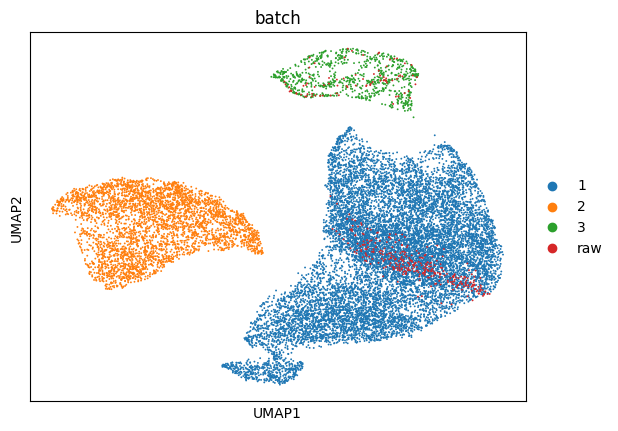

In [20]:
sc.pl.umap(adata_merge, color="batch")
adata_merge.write_h5ad("ForAnno.h5ad")

## check the automatic annotation results 

In [13]:
import pickle
# annotation from celltypist, detail can be found in Anno_EC.ipynb
with open("cellltypist_anno.pkl", "rb") as f:
    prediction = pickle.load(f)

In [11]:
adata_merge = sc.read_h5ad("ForAnno.h5ad")

/data/chenyx/anaconda3/envs/scMulan/lib/python3.9/site-packages/anndata/_core/anndata.py:1898: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


/data/chenyx/anaconda3/envs/scMulan/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/data/chenyx/anaconda3/envs/scMulan/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


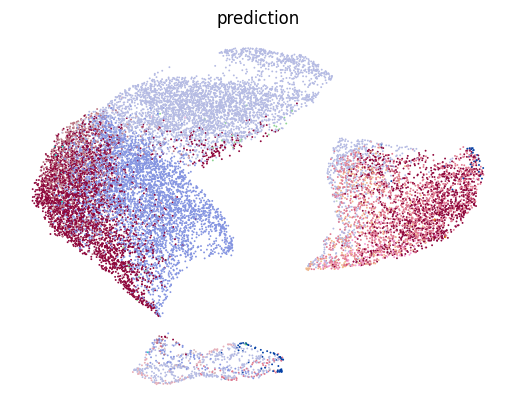

In [28]:
adata.obs['prediction'] = prediction
sc.pl.umap(adata, color=["prediction"],  frameon=False, legend_loc=None, save="FigS10.pdf")

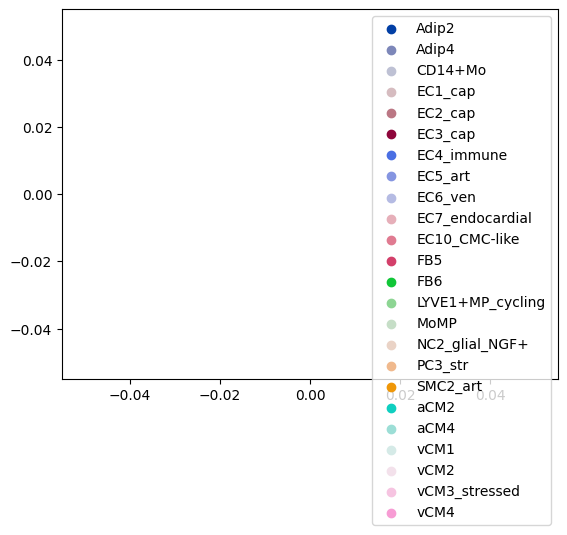

In [30]:
import matplotlib.pyplot as plt
plt.rcParams['pdf.fonttype'] = 42
plt.scatter([], [])

colors = adata.uns['prediction_colors']
labels = adata.obs.prediction.cat.categories

# 根据你的颜色和标签创建图例
for color, label in zip(colors, labels):
    plt.scatter([], [], c=color, label=label)

plt.legend()
plt.savefig("figures/FigS10_Legend_only.pdf")  # 导出为PDF
plt.show()

In [23]:
cm = pd.crosstab(adata.obs.batch, adata.obs.prediction).transpose()
df_prop = cm/cm.sum()

In [41]:
df_prop1 = df_prop.loc[['EC1_cap', 'EC2_cap', 'EC3_cap',
                  'EC4_immune', 'EC5_art', 'EC6_ven', 'EC7_endocardial',
                  'EC10_CMC-like']]
df_prop2 = df_prop.drop(['EC1_cap', 'EC2_cap', 'EC3_cap',
                  'EC4_immune', 'EC5_art', 'EC6_ven', 'EC7_endocardial',
                  'EC10_CMC-like'], axis=0)
df_prop1.loc["others", :] = df_prop2.sum()

In [44]:
import seaborn as sns

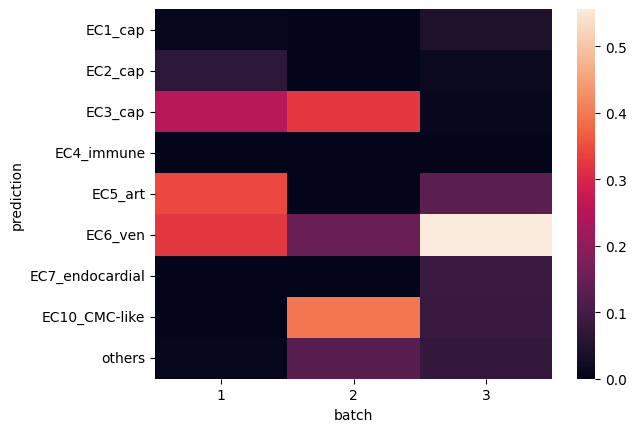

In [47]:
sns.heatmap(df_prop1)
plt.savefig("figures/Annotation_results_CM.pdf")

## check the expression in the clusters

In [31]:
adata_1 = adata[adata.obs.leiden.isin(["0","1"])].copy()
adata_2 = adata[adata.obs.leiden.isin(["2"])].copy()
adata_3 = adata[adata.obs.leiden.isin(["3"])].copy()

In [32]:
import seaborn as sns

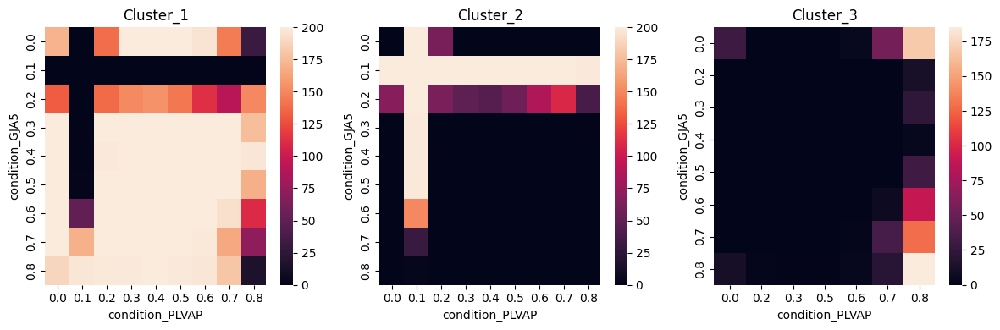

In [33]:
fig, axs  = plt.subplots(1,3,figsize=(12,4))
sns.heatmap(pd.crosstab(adata_1.obs.condition_GJA5, adata_1.obs.condition_PLVAP),ax=axs[0])
axs[0].set_title("Cluster_1")

sns.heatmap(pd.crosstab(adata_2.obs.condition_GJA5, adata_2.obs.condition_PLVAP),ax=axs[1])
axs[1].set_title("Cluster_2")

sns.heatmap(pd.crosstab(adata_3.obs.condition_GJA5, adata_3.obs.condition_PLVAP),ax=axs[2])
axs[2].set_title("Cluster_3")
plt.tight_layout()
plt.savefig("figures/FigS11.pdf")

/data/chenyx/anaconda3/envs/scMulan/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:842: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/data/chenyx/anaconda3/envs/scMulan/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:842: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(
/data/chenyx/anaconda3/envs/scMulan/lib/python3.9/site-packages/seaborn/_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


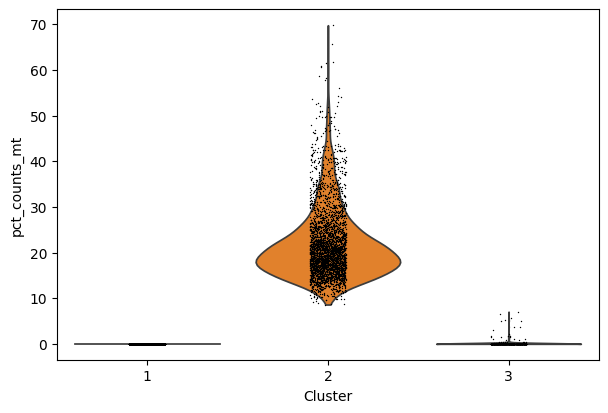

In [34]:
sc.pl.violin(adata,"pct_counts_mt", groupby="Cluster", save="Pct_MT.pdf")

## Check the expression distribution in the training set of hECA10M

In [35]:
adata_train = sc.read_h5ad("/home/bianhaiyang/projects/cellgpt_v1/dataHub/raw_data/heart_cyx/heart_corrected.h5ad")
adata_train = adata_train[adata_train.obs.cell_type.isin(["Vascular endothelial cell",'Capillary endothelial cell'])]

In [36]:
def bin_and_process_adata(adata_tar):
    
    all_cells_expr = []
    cell_idx = []
    gene_set = adata_tar.var_names.tolist()

    for i in tqdm(range(len(adata_tar.obs_names))):
        
        cell_id = adata_tar.obs_names[i]
        
        genes_series = pd.DataFrame(adata_tar[i].X.toarray(), columns=adata_tar.var_names).loc[0]
        expressed_genes = genes_series[genes_series > 0].index.tolist()
        expr_values = genes_series[expressed_genes].values
        cell_expression_dict = {gene: expr_value for gene, expr_value in zip(expressed_genes, expr_values)}

        expressed_genes = list(cell_expression_dict.keys())[::-1]
        expression_values = list(cell_expression_dict.values())[::-1]
        max_expression = np.max(expression_values)
        bins = np.linspace(0, max_expression, n_express_level+1)
        binned_expr = np.digitize(expression_values, bins, right=True)

        # 创建当前细胞的表达数据字典
        expr_dict = dict(zip(expressed_genes, binned_expr))

        # 创建全基因列表的表达值，未出现的基因设置为0
        expr_hvg = [expr_dict.get(gene, 0) for gene in gene_set]

        all_cells_expr.append(expr_hvg)

        cell_idx.append(cell_id)
        
    expr_df = pd.DataFrame(all_cells_expr, columns=gene_set, index=cell_idx)    
    adata_processed = sc.AnnData(expr_df)
    adata_processed.obs_names = cell_idx
    return adata_processed

In [15]:
adata_sampled = adata_train[np.random.choice(adata_train.obs_names, size=100000, replace=False),meta_info['gene_set']]
adata_train_bin = bin_and_process_adata(adata_sampled)

100%|██████████| 100000/100000 [27:04:25<00:00,  1.03it/s]    


In [21]:
adata_train_bin.obs = adata_sampled.obs

In [22]:
adata_train_bin.obs.cell_type.value_counts()

Capillary endothelial cell    67246
Vascular endothelial cell     32754
Name: cell_type, dtype: int64

In [24]:
df_expression_pair = pd.crosstab(adata_train_bin.X[adata_train_bin.obs.cell_type=="Vascular endothelial cell",adata_train_bin.var.index=="GJA5"].reshape(-1), adata_train_bin.X[adata_train_bin.obs.cell_type=="Vascular endothelial cell",adata_train_bin.var.index=="PLVAP"].reshape(-1))
df_expression_pair

col_0,0,1,2,3,4,5,6,7,8,9,10
row_0,,,,,,,,,,,
0,22297,28,44,125,359,842,1762,2556,1468,425,201
1,2,0,1,0,1,0,0,0,0,0,0
2,9,0,2,2,1,0,0,0,0,0,0
3,106,0,0,14,2,5,6,5,0,0,0
4,328,1,3,12,27,9,9,3,1,0,0
5,462,0,1,10,17,19,6,11,2,0,0
6,564,0,0,9,12,12,30,6,2,0,0
7,474,0,0,4,9,7,9,19,4,1,0
8,228,0,0,0,2,2,3,3,7,0,1


In [48]:
df_expression_pair.index = [f"0.{i}" for i in range(10)] + ['1.0']
df_expression_pair.columns = [f"0.{i}" for i in range(10)] + ['1.0']

In [101]:
df_expression_pair.iloc[0,0] = 0

<Axes: >

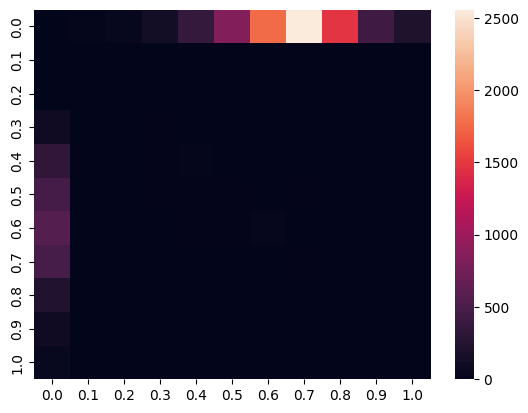

In [106]:
sns.heatmap(df_expression_pair)

In [107]:
data = df_expression_pair

/tmp/ipykernel_686175/1297533066.py:23: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


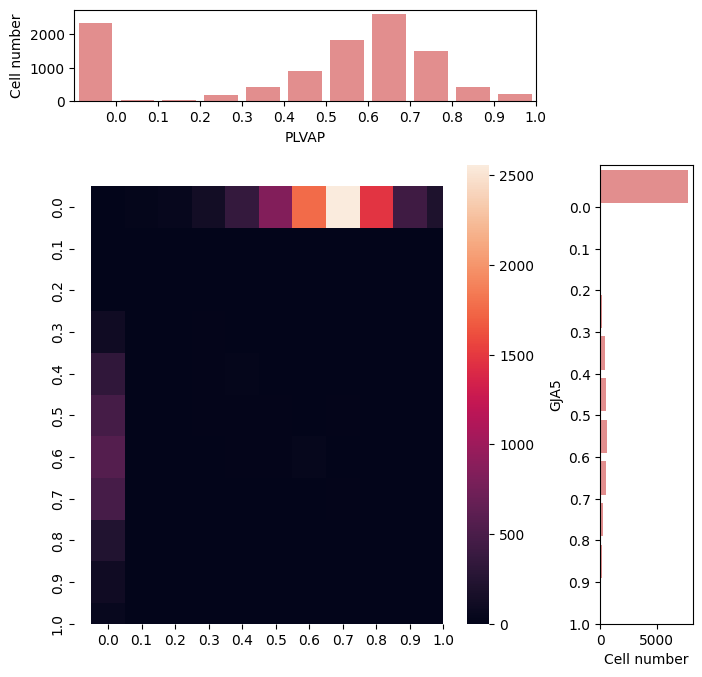

In [122]:
# 设置图形布局
fig = plt.figure(figsize=(10, 10))
grid = fig.add_gridspec(3, 3, width_ratios=[0.2, 1, 0.2], height_ratios=[0.2, 1, 0.2], hspace=0.3, wspace=0.3)

# 在中心位置绘制热力图
ax_main = fig.add_subplot(grid[1, 1])
sns.heatmap(data, ax=ax_main, cbar=True)

# 绘制列直方图
ax_top = fig.add_subplot(grid[0, 1], sharex=ax_main)
col_sums = data.sum(axis=0)
sns.barplot(x=col_sums.index, y=col_sums.values, ax=ax_top, color="lightcoral")
ax_top.set_ylabel("Cell number")
ax_top.set_xlabel("PLVAP")

# 绘制行直方图
ax_right = fig.add_subplot(grid[1, 2], sharey=ax_main)
row_sums = data.sum(axis=1)
sns.barplot(y=row_sums.index, x=row_sums.values, ax=ax_right, orient="h", color="lightcoral")
ax_right.set_xlabel("Cell number")
ax_right.set_ylabel("GJA5")

plt.tight_layout()
plt.savefig("figures/FigS9.pdf")
plt.show()

# Analysis the continous trajectory in the generated data

In [53]:
adata_1 = sc.read_h5ad("vascular_axis.h5ad")

In [54]:
sc.pp.pca(adata_1)
sc.pp.neighbors(adata_1,n_pcs=5)
sc.tl.umap(adata_1)

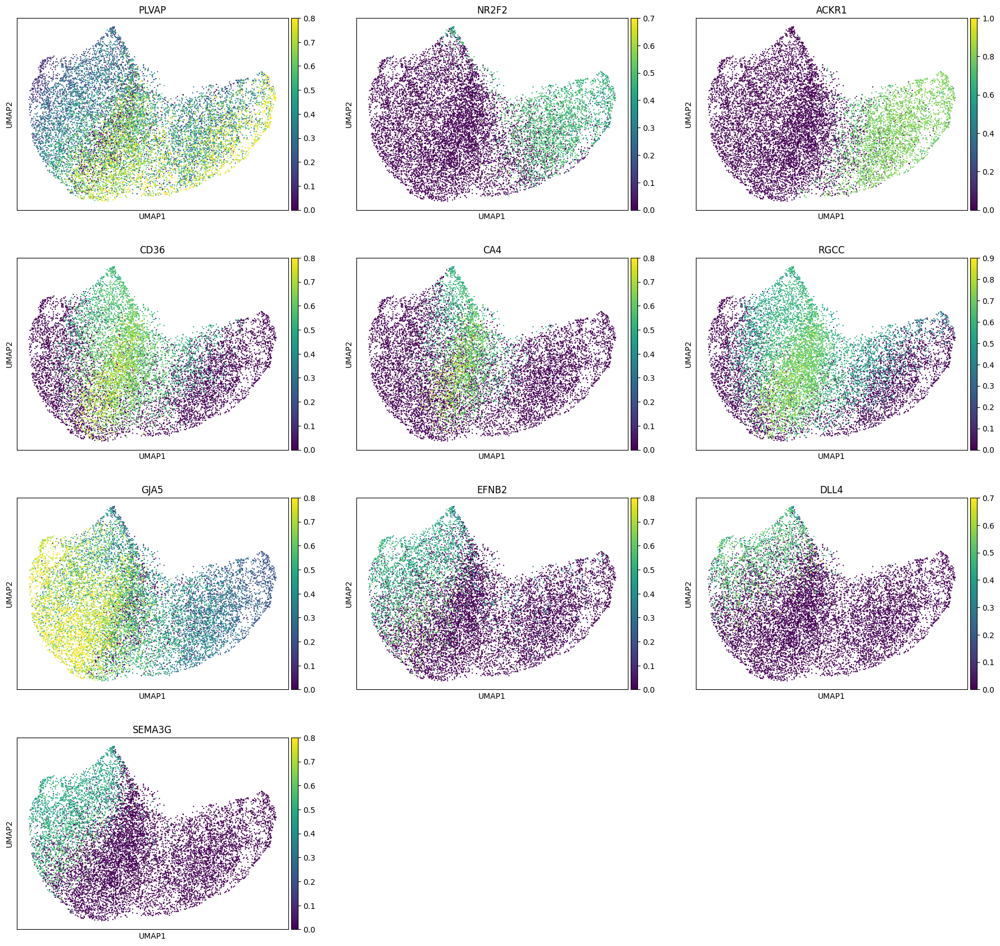

In [55]:
sc.pl.umap(adata_1, color=['PLVAP','NR2F2','ACKR1',#vEC
                         'CD36','CA4','RGCC',#cap
                         'GJA5','EFNB2','DLL4', 'SEMA3G'#aEC
                         ],ncols=3)

In [16]:
import seaborn as sns

In [73]:
sc.tl.draw_graph(adata_1)
sc.tl.louvain(adata_1, resolution=1)
sc.tl.paga(adata_1, groups="louvain")

/data/chenyx/anaconda3/envs/scMulan/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


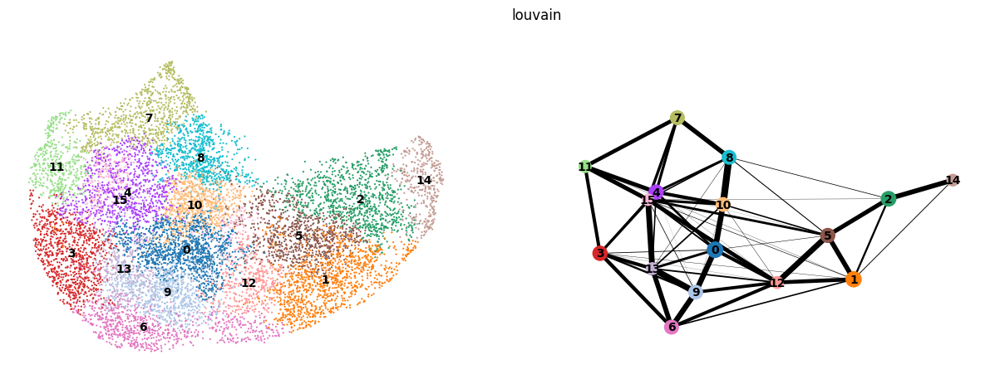

In [74]:
sc.pl.paga_compare(adata_1)

/data/chenyx/anaconda3/envs/scMulan/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


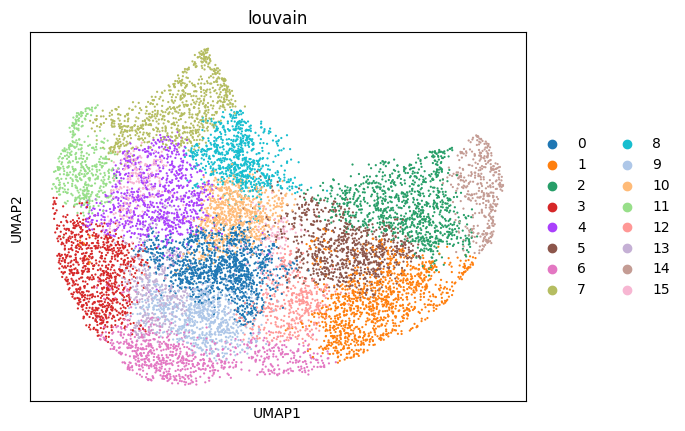

In [75]:
sc.pl.umap(adata_1,color="louvain")
adata_1.uns["iroot"] = np.flatnonzero(adata_1.obs["louvain"] == "11")[0]
sc.tl.dpt(adata_1)

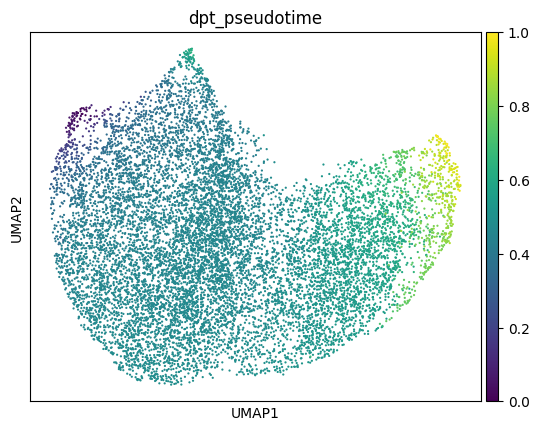

In [76]:
sc.pl.umap(adata_1,color="dpt_pseudotime")

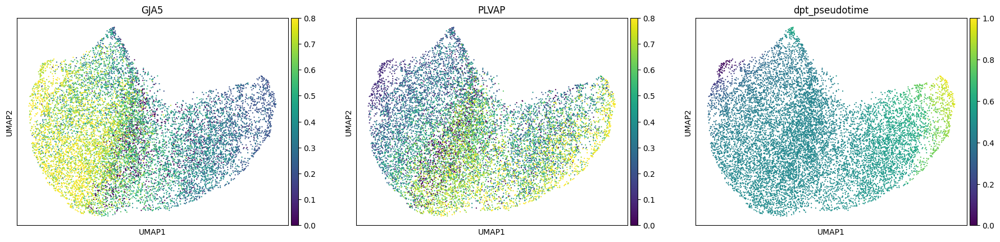

In [56]:
sc.pl.umap(adata_1,color=["GJA5",'PLVAP',"dpt_pseudotime"], save="Fig5b.pdf")

In [61]:
pseudo_time = adata_1.obs.dpt_pseudotime

## Marker gene

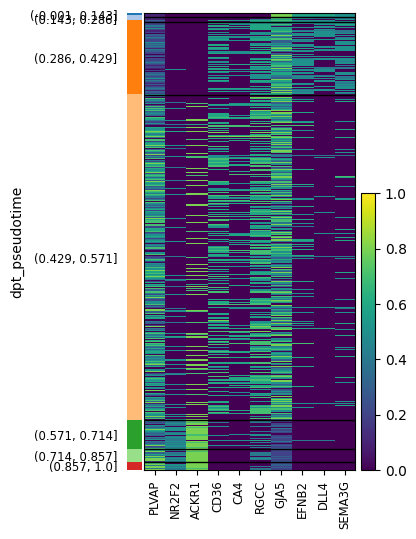

In [78]:
sc.pl.heatmap(adata_1, 
              var_names=['PLVAP','NR2F2','ACKR1',#vEC
                         'CD36','CA4','RGCC',#cap
                         'GJA5','EFNB2','DLL4', 'SEMA3G'#aEC
                         ], 
              groupby='dpt_pseudotime', use_raw=False, show_gene_labels=True,
             )

In [57]:
adata_1.obs['dpt_pseudotime_group'] = (adata_1.obs['dpt_pseudotime']/0.1).astype(int)

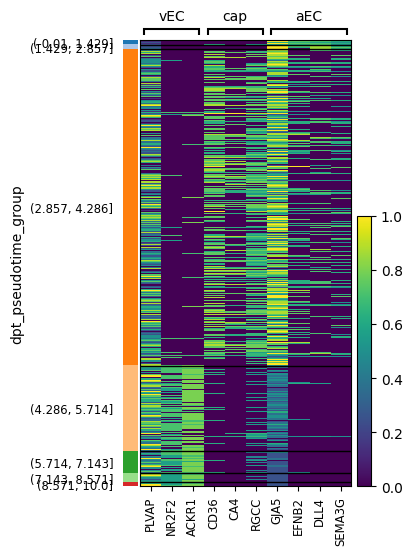

In [58]:
genes = ['PLVAP','NR2F2','ACKR1',#vEC
                         'CD36','CA4','RGCC',#cap
                         'GJA5','EFNB2','DLL4', 'SEMA3G'#aEC
                         ]
gene_groups = [
    ('vEC', ['PLVAP', 'NR2F2', 'ACKR1']),
    ('cap', ['CD36', 'CA4', 'RGCC']),
    ('aEC', ['GJA5', 'EFNB2', 'DLL4', 'SEMA3G'])
]
group_labels = [group[0] for group in gene_groups]
group_positions = [(list(map(genes.index, group[1]))) for group in gene_groups]
group_positions = [(min(pos), max(pos)) for pos in group_positions]

sc.pl.heatmap(
    adata_1, 
    var_names=genes, 
    groupby='dpt_pseudotime_group', 
    
    use_raw=False, 
    show_gene_labels=True, 
    var_group_labels=group_labels, 
    var_group_positions=group_positions,
    standard_scale="var"
)

In [59]:
import numpy as np
import pandas as pd
from scipy.stats import zscore
from sklearn.preprocessing import MinMaxScaler
from statsmodels.nonparametric.smoothers_lowess import lowess

def smooth_and_scale(mat_sig_scaled):
    def loess_smoothing(x):
        data = pd.DataFrame({'order': range(1, len(x) + 1), 'gene_expr': x})
        smoothed = lowess(data['gene_expr'], data['order'], delta=0.02*len(data['order']), frac=0.15, return_sorted=False)
        return smoothed

    # Apply loess smoothing to each row
    smoothed_matrix_fitted = np.apply_along_axis(loess_smoothing, 1, mat_sig_scaled)
    
    # Replace NaN values with column means
    smoothed_matrix_fitted = np.where(np.isnan(smoothed_matrix_fitted), 
                                      np.nanmean(smoothed_matrix_fitted, axis=0), 
                                      smoothed_matrix_fitted)
    
    # Transpose and scale the data
    smoothed_matrix_fitted = smoothed_matrix_fitted.T
    scaled_matrix = zscore(smoothed_matrix_fitted, axis=0)
    
    # Apply Min-Max scaling
    scaler = MinMaxScaler(feature_range=(-2, 2))
    scaled_matrix = scaler.fit_transform(scaled_matrix)
    
    return scaled_matrix.T

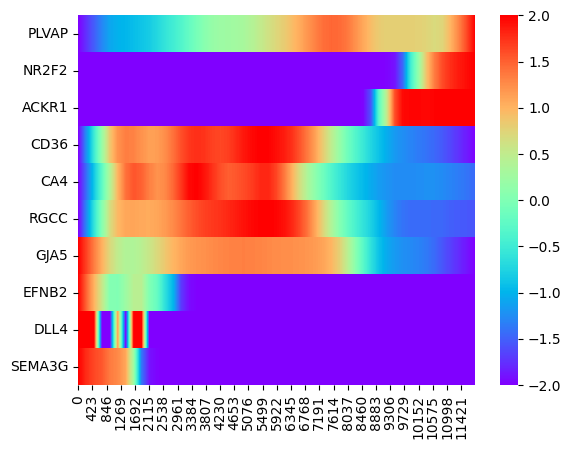

In [63]:
df_markers = adata_1[np.argsort(pseudo_time),['PLVAP','NR2F2','ACKR1',#vEC
                         'CD36','CA4','RGCC',#cap
                         'GJA5','EFNB2','DLL4', 'SEMA3G'#aEC
                         ]].X.transpose()
df_markers_smoothed = smooth_and_scale(df_markers)
df_markers_smoothed = pd.DataFrame(df_markers_smoothed, index=['PLVAP','NR2F2','ACKR1',#vEC
                         'CD36','CA4','RGCC',#cap
                         'GJA5','EFNB2','DLL4', 'SEMA3G'#aEC
                         ])
sns.heatmap(df_markers_smoothed, cmap="rainbow")
plt.savefig("figures/Fig5c.pdf")

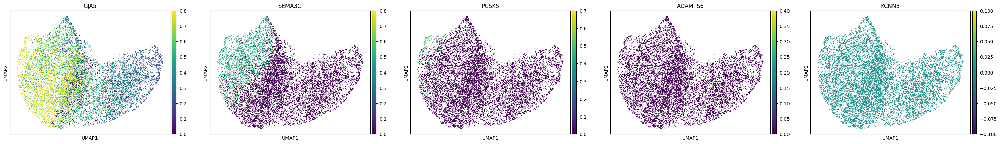

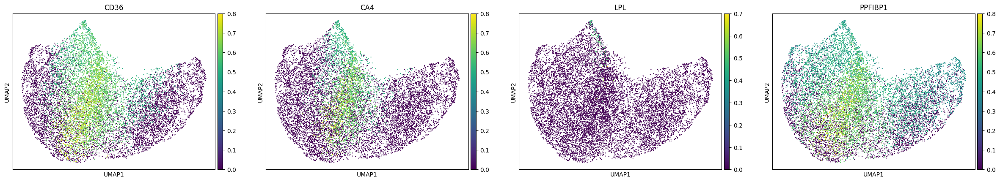

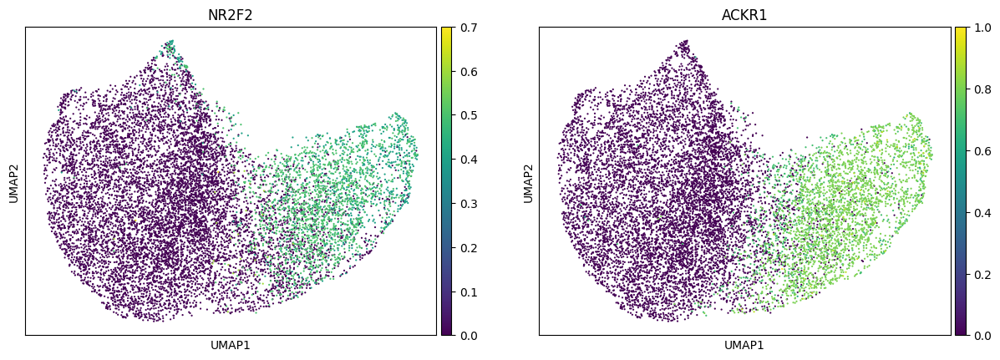

In [82]:
sc.pl.umap(adata_1, color=['GJA5', 'SEMA3G', "PCSK5", 'ADAMTS6', 'KCNN3'], ncols=5)
sc.pl.umap(adata_1, color=['CD36','CA4','LPL','PPFIBP1'])
sc.pl.umap(adata_1, color=['NR2F2','ACKR1'])

In [83]:
adata_1.write_h5ad("vascular_axis.h5ad")

## Zonated gene

In [64]:
clustered_df = pd.DataFrame(adata_1.X[np.argsort(pseudo_time),:], columns=adata_1.var.index)
clustered_df = clustered_df.loc[:,clustered_df.std(axis=0)>0]

In [65]:
def smooth_and_scale(mat_sig_scaled):
    def loess_smoothing(x):
        data = pd.DataFrame({'order': range(1, len(x) + 1), 'gene_expr': x})
        smoothed = lowess(data['gene_expr'], data['order'], delta=0.01*len(data['order']), frac=0.2, return_sorted=False)
        return smoothed

    # Apply loess smoothing to each row
    smoothed_matrix_fitted = np.apply_along_axis(loess_smoothing, 1, mat_sig_scaled)
    
    # Replace NaN values with column means
    smoothed_matrix_fitted = np.where(np.isnan(smoothed_matrix_fitted), 
                                      np.nanmean(smoothed_matrix_fitted, axis=0), 
                                      smoothed_matrix_fitted)
    
    # Transpose and scale the data
    smoothed_matrix_fitted = smoothed_matrix_fitted.T
    scaled_matrix = zscore(smoothed_matrix_fitted, axis=0)
    
    # Apply Min-Max scaling
    scaler = MinMaxScaler(feature_range=(-2, 2))
    scaled_matrix = scaler.fit_transform(scaled_matrix)
    
    return scaled_matrix.T

In [66]:
clustered_df_smoothed = smooth_and_scale(clustered_df.transpose())
clustered_df_smoothed = pd.DataFrame(clustered_df_smoothed, index=clustered_df.columns)
clustered_df_smoothed = clustered_df_smoothed.dropna()

/data/chenyx/anaconda3/envs/scMulan/lib/python3.9/site-packages/sklearn/preprocessing/_data.py:479: RuntimeWarning: All-NaN slice encountered
  data_min = np.nanmin(X, axis=0)
/data/chenyx/anaconda3/envs/scMulan/lib/python3.9/site-packages/sklearn/preprocessing/_data.py:480: RuntimeWarning: All-NaN slice encountered
  data_max = np.nanmax(X, axis=0)


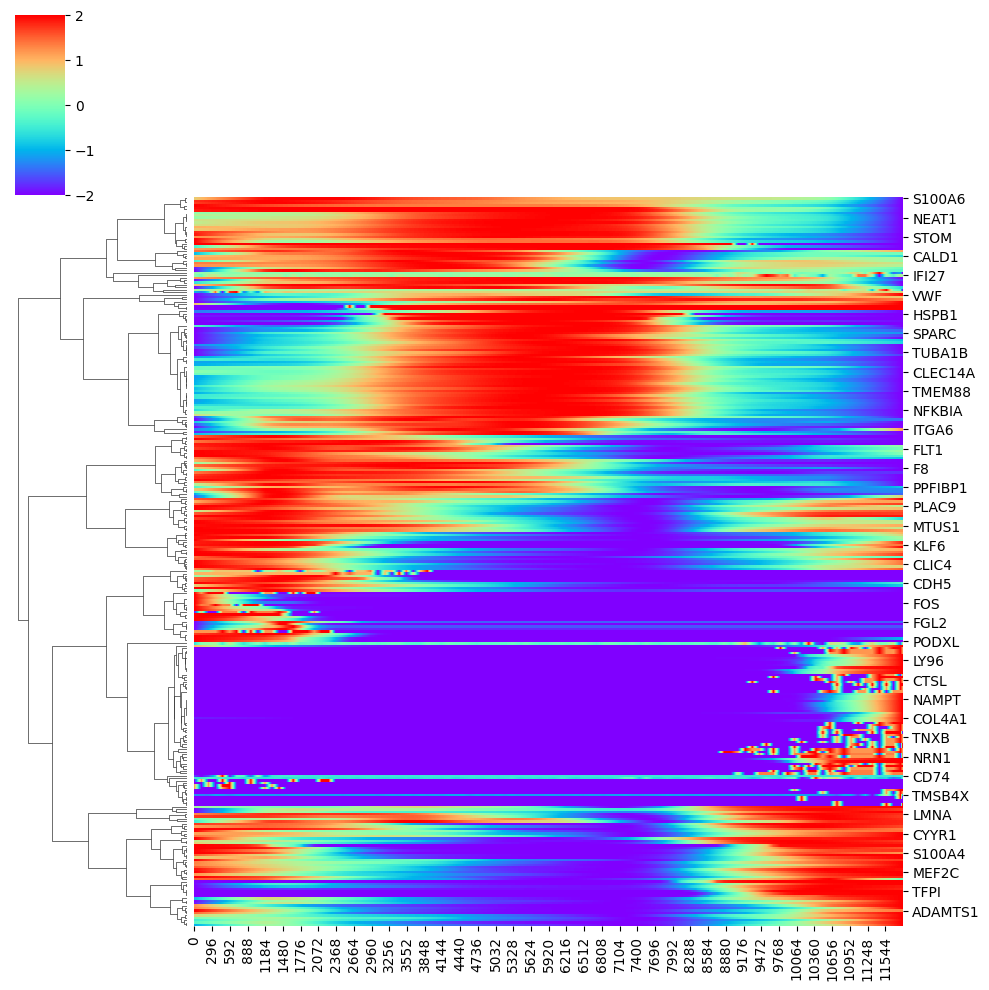

In [72]:
g = sns.clustermap(clustered_df_smoothed,col_cluster=False,cmap="rainbow",metric='cosine',method='complete')
row_cluster_order = g.dendrogram_row.reordered_ind
row_linkage = g.dendrogram_row.linkage

In [68]:
from scipy.cluster.hierarchy import fcluster
row_clusters = fcluster(row_linkage, t=10, criterion='maxclust')

In [69]:
np.unique(row_clusters,return_counts=True)

(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10], dtype=int32),
 array([31,  9,  7, 52, 26, 30, 30, 68,  7, 43]))

In [70]:
for i in range(1,11):
    print(list(clustered_df_smoothed.index[row_clusters==i]))

['A2M', 'ANXA1', 'BST2', 'CALD1', 'CAV1', 'CAVIN1', 'CLDN5', 'FABP4', 'GIMAP7', 'GJA5', 'GNG11', 'ICAM2', 'ID1', 'ID3', 'NEAT1', 'PALMD', 'PCAT19', 'PPP1R14A', 'RBP7', 'S100A6', 'SLC9A3R2', 'SRGN', 'STOM', 'SYNE1', 'SYNE2', 'TIMP3', 'TM4SF1', 'TSC22D1', 'TSPAN13', 'TXNIP', 'YBX3']
['B2M', 'CST3', 'FTH1', 'IFI27', 'IFITM2', 'IFITM3', 'IL32', 'MT1X', 'RNASE1']
['ADIRF', 'AQP1', 'IGFBP7', 'PLVAP', 'RAMP3', 'SPARCL1', 'VWF']
['ADGRL4', 'AHNAK', 'ANXA2', 'APP', 'ARHGAP29', 'ARHGDIB', 'ATP1B3', 'CA4', 'CD34', 'CD36', 'CEBPD', 'CLEC14A', 'CRIP2', 'CXCL2', 'DDIT4', 'EGFL7', 'ENG', 'EPAS1', 'ESAM', 'FTL', 'GIMAP4', 'GSN', 'GYPC', 'HSP90AA1', 'HSPB1', 'IFI16', 'IFITM1', 'ITGA6', 'ITM2A', 'LDB2', 'LGALS1', 'MT2A', 'NFKBIA', 'PDLIM1', 'PECAM1', 'RAMP2', 'RGCC', 'RGS5', 'RHOC', 'S100A10', 'S100A11', 'S100A9', 'SEC14L1', 'SNCG', 'SPARC', 'TCIM', 'TINAGL1', 'TMEM88', 'TNFSF10', 'TPM1', 'TUBA1B', 'VAMP5']
['ADGRF5', 'ANXA3', 'APOLD1', 'CAVIN2', 'CCN1', 'CD9', 'CYBA', 'F8', 'FAM107A', 'FCN3', 'FLT1', '

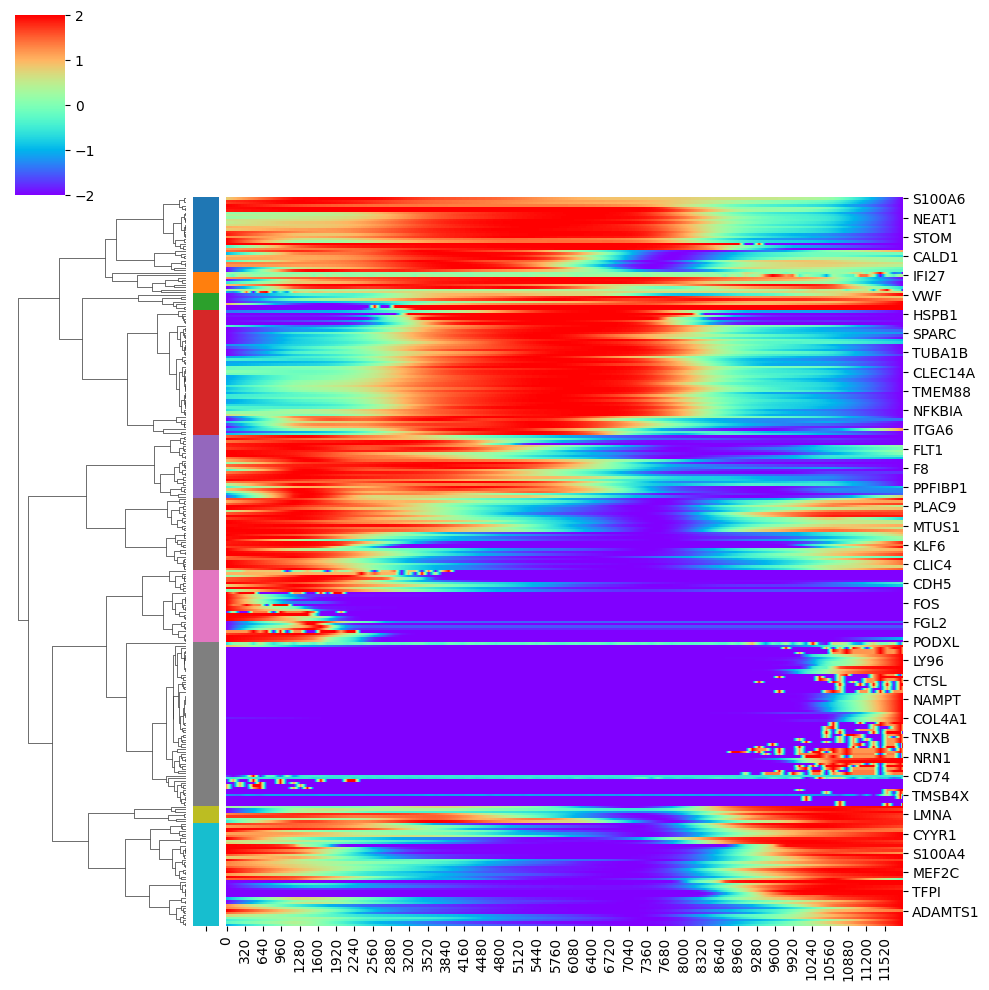

In [77]:
ordered_row_clusters = [row_clusters[i] for i in row_cluster_order]

palette = sns.color_palette("tab10", n_colors=max(ordered_row_clusters))
cluster_colors = [palette[i - 1] for i in ordered_row_clusters]

row_colors = pd.Series(cluster_colors, index=clustered_df_smoothed.index[row_cluster_order])

sns.clustermap(clustered_df_smoothed, col_cluster=False, cmap="rainbow", metric='cosine', method='complete',
               row_colors=row_colors)
plt.savefig("figures/Fig5d.pdf")
plt.show()

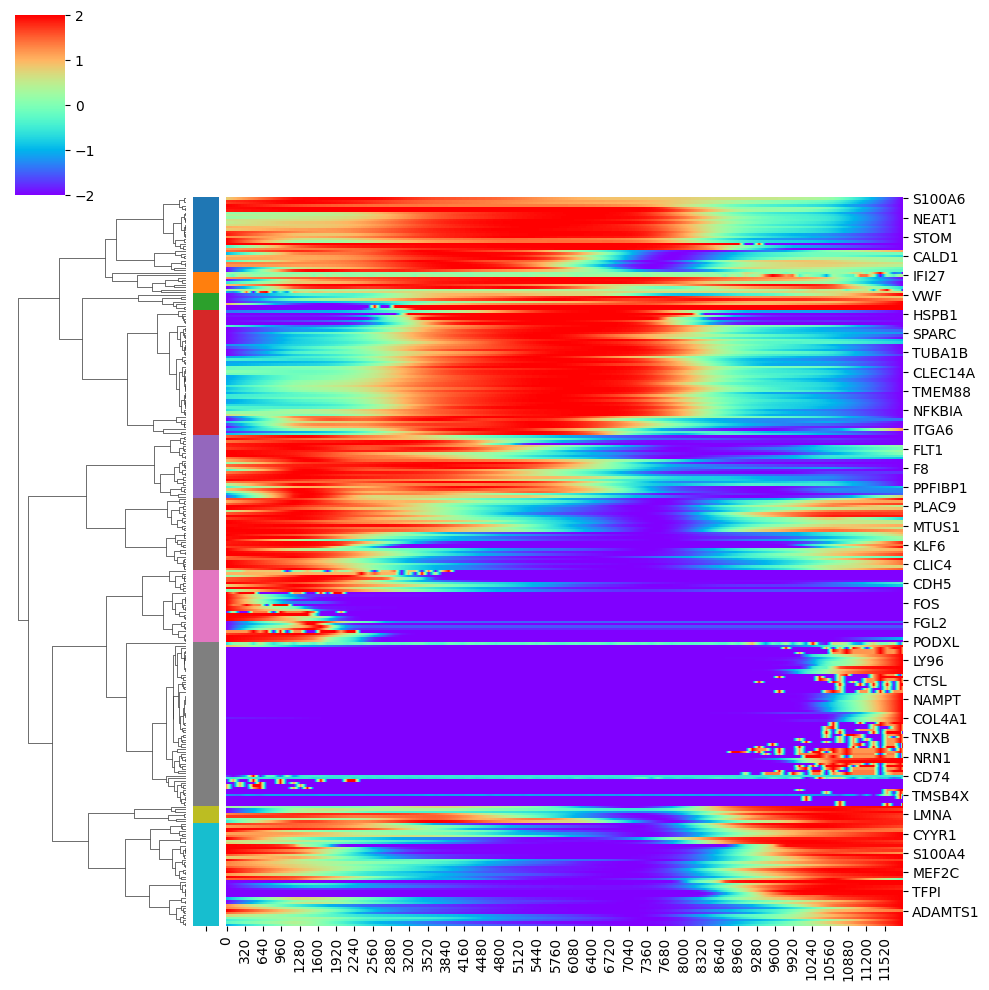

In [78]:
sns.clustermap(clustered_df_smoothed, col_cluster=False, cmap="rainbow", metric='cosine', method='complete',
               row_colors=row_colors)
plt.savefig("figures/Fig5d.png")

#### enrichment

In [79]:
import gseapy as gp

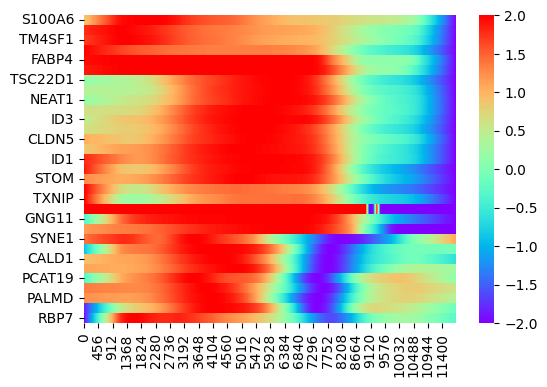

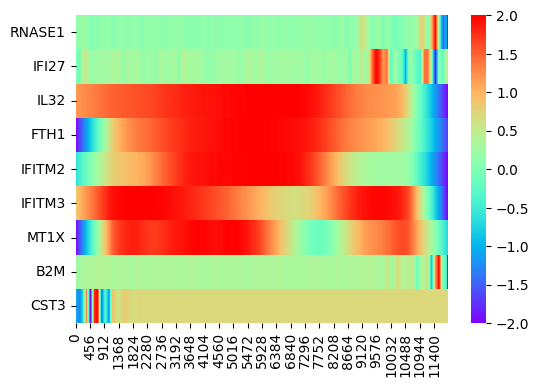

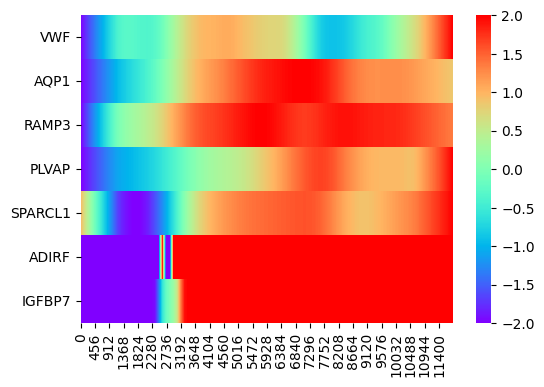

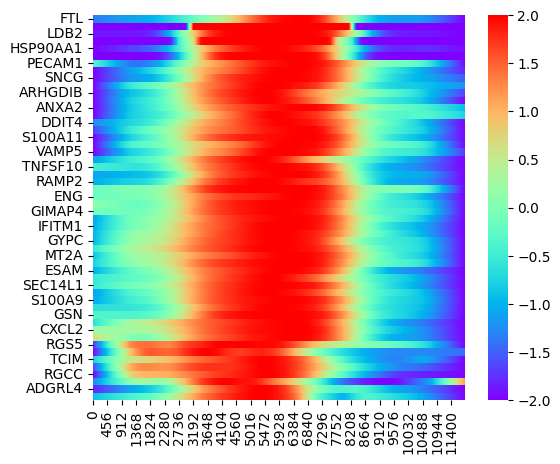

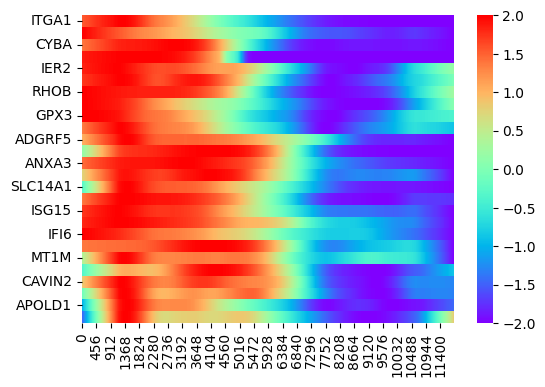

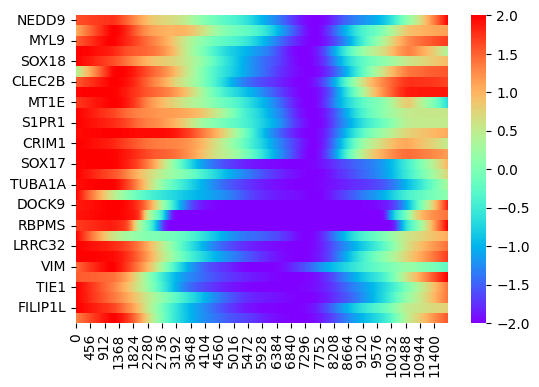

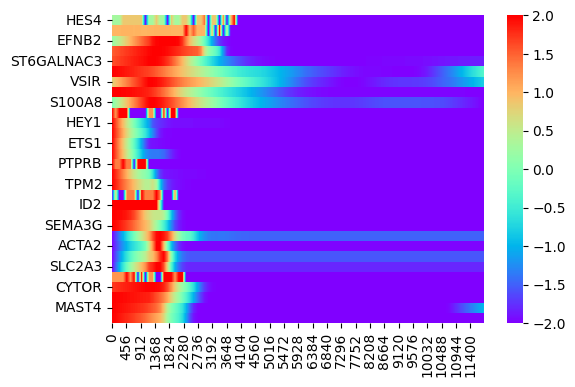

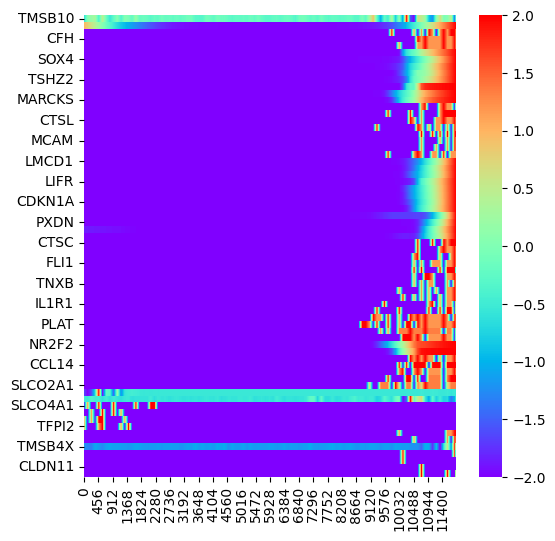

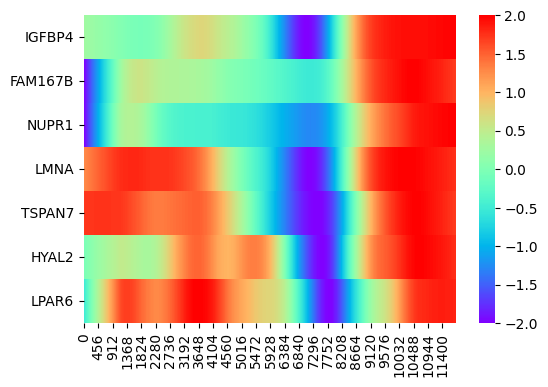

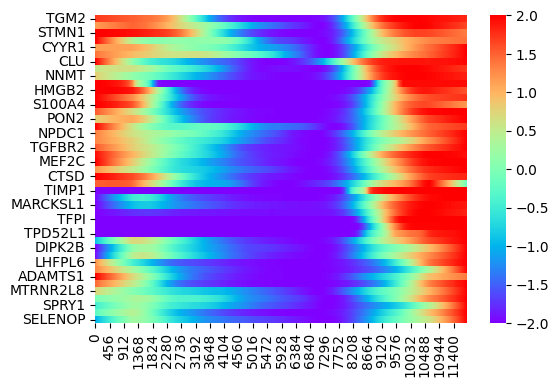

In [93]:
for i in range(1,11):
    plt.figure(figsize=(6,max(4, int(sum(row_clusters==i)/10))))
    df_plot = clustered_df_smoothed.iloc[row_cluster_order,:]
    df_plot = df_plot[df_plot.index.isin(clustered_df_smoothed.index[row_clusters==i])]
    sns.heatmap(df_plot, cmap="rainbow")

/data/chenyx/anaconda3/envs/scMulan/lib/python3.9/site-packages/gseapy/plot.py:694: FutureWarning: The 'method' keyword in Series.replace is deprecated and will be removed in a future version.
  df[self.colname].replace(
/data/chenyx/anaconda3/envs/scMulan/lib/python3.9/site-packages/gseapy/plot.py:694: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[self.colname].replace(
/data/chenyx/anaconda3/envs/scMulan/lib/python3.9/site-packages/gseapy/plot.py:694: FutureWarning: The 'method' keyword in Series.replace is deprecated and

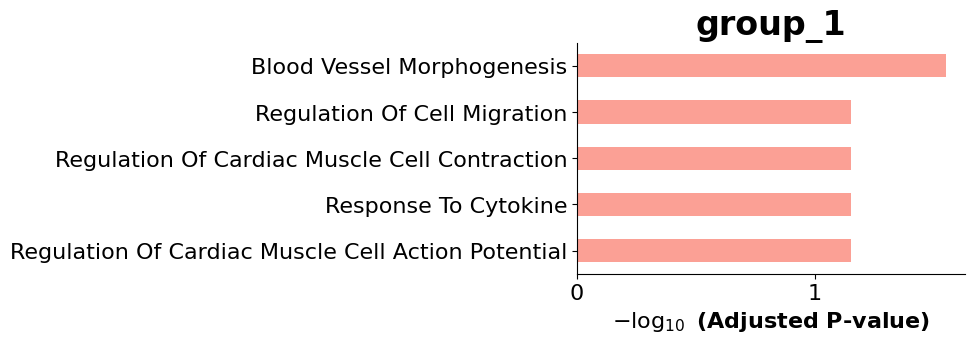

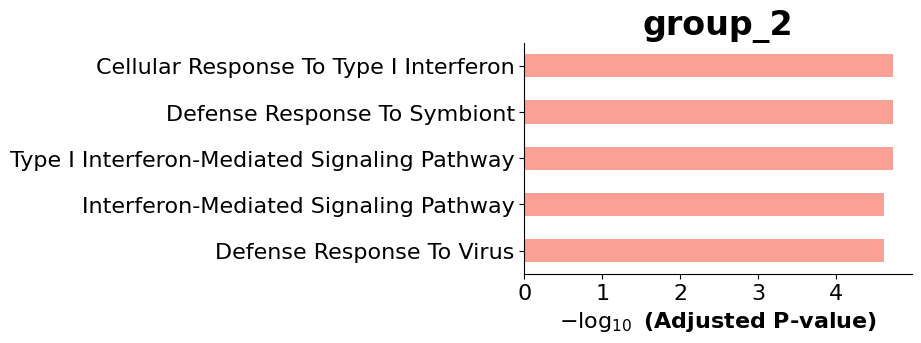

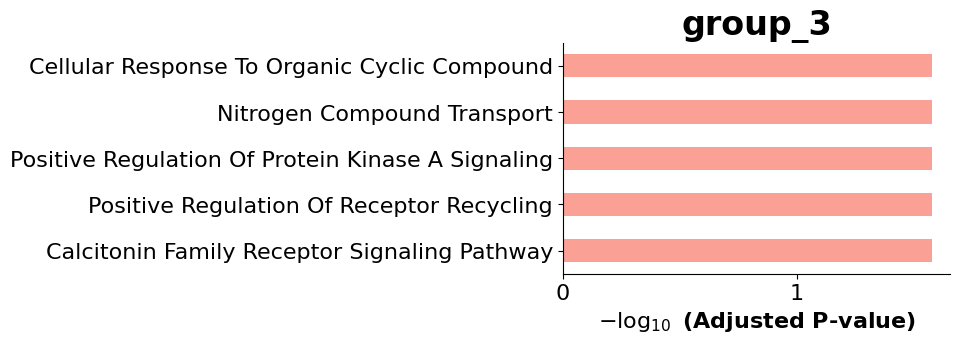

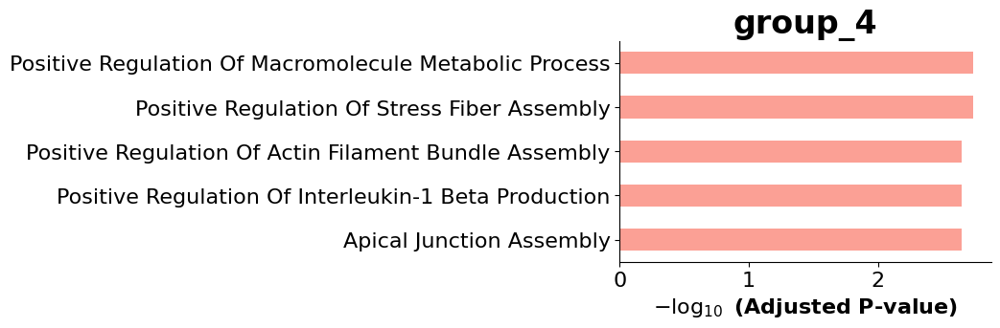

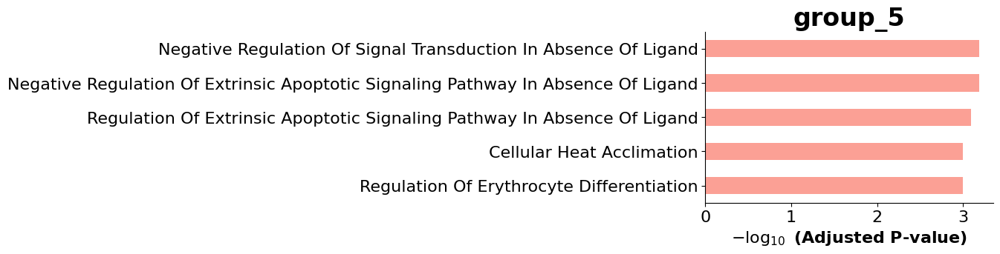

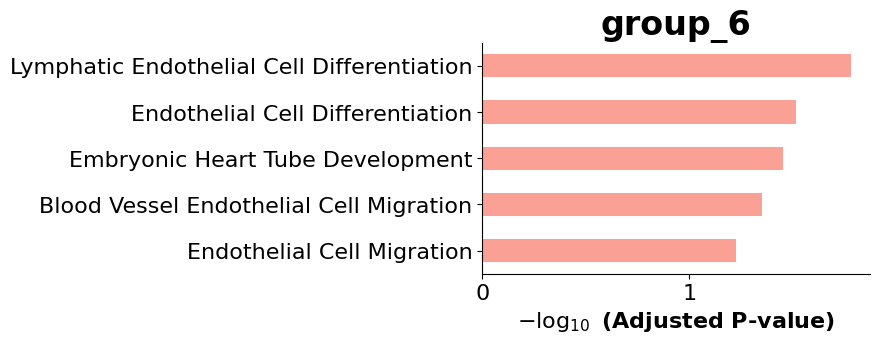

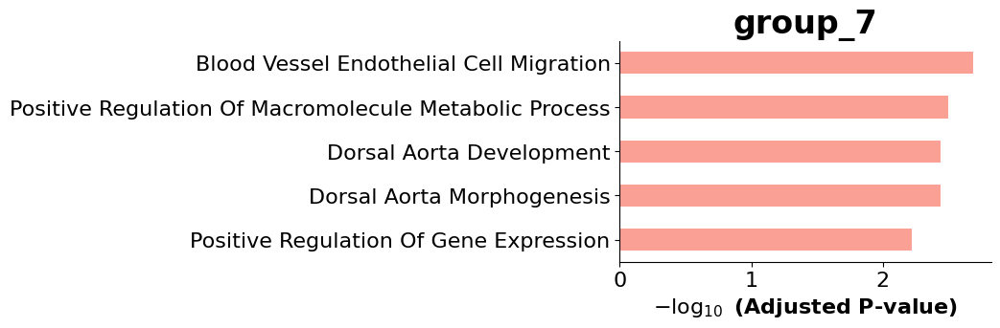

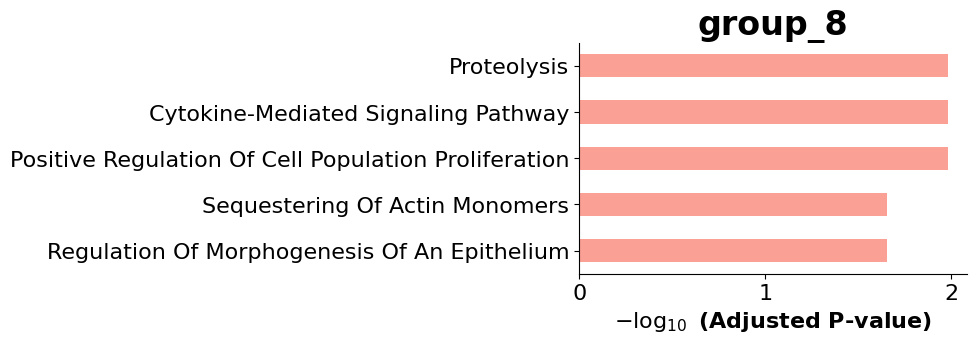

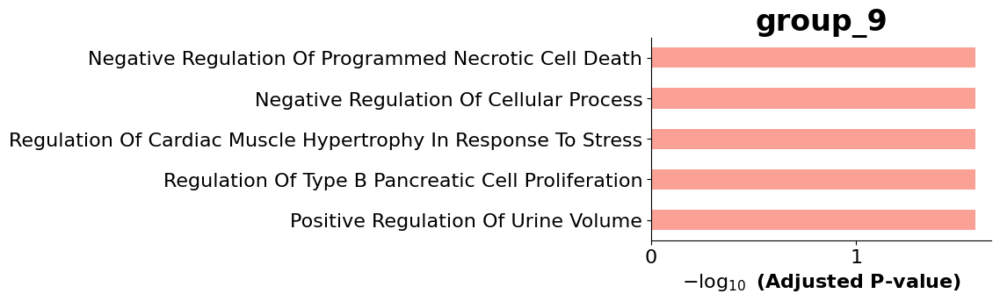

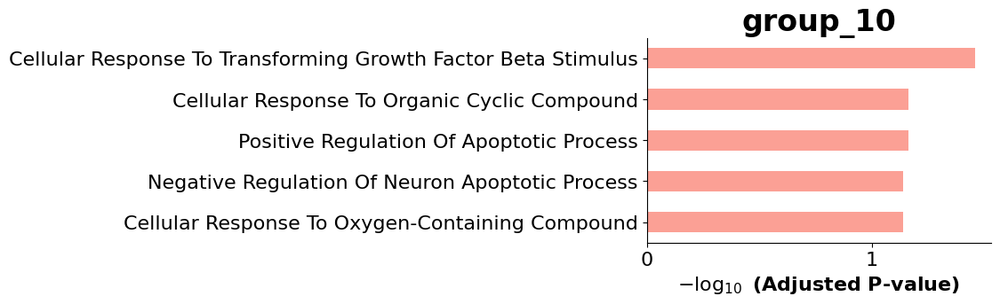

In [81]:
for i in range(1,11):
    enr = gp.enrichr(list(clustered_df_smoothed.index[row_clusters==i]),
                    gene_sets='GO_Biological_Process_2023',
                    outdir=None)
    enr.res2d.Term = enr.res2d.Term.str.split(" \(GO").str[0]
    gp.barplot(enr.res2d, title=f"group_{i}", top_term=5, figsize=(5,3),cutoff=0.1)
    plt.savefig(f"figures/group_{i}.pdf")

/data/chenyx/anaconda3/envs/scMulan/lib/python3.9/site-packages/gseapy/plot.py:694: FutureWarning: The 'method' keyword in Series.replace is deprecated and will be removed in a future version.
  df[self.colname].replace(
/data/chenyx/anaconda3/envs/scMulan/lib/python3.9/site-packages/gseapy/plot.py:694: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[self.colname].replace(
/data/chenyx/anaconda3/envs/scMulan/lib/python3.9/site-packages/gseapy/plot.py:694: FutureWarning: The 'method' keyword in Series.replace is deprecated and

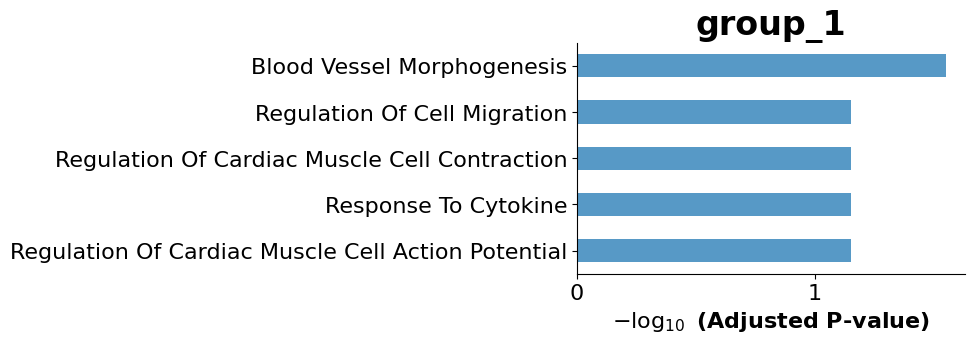

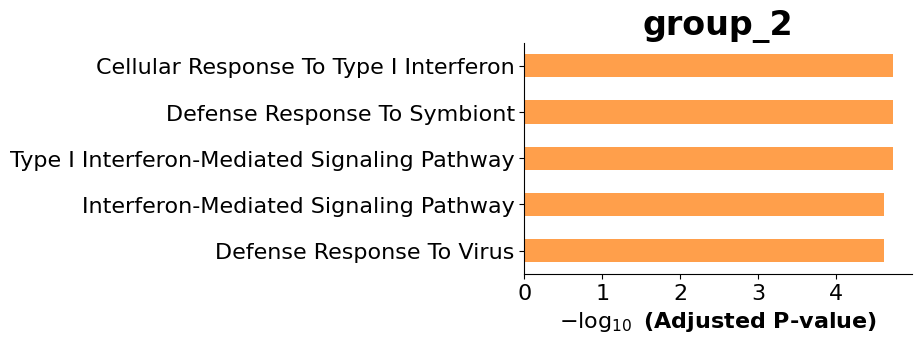

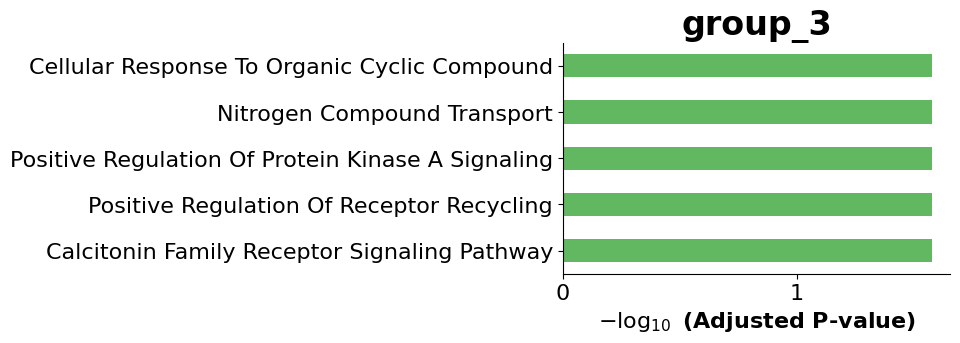

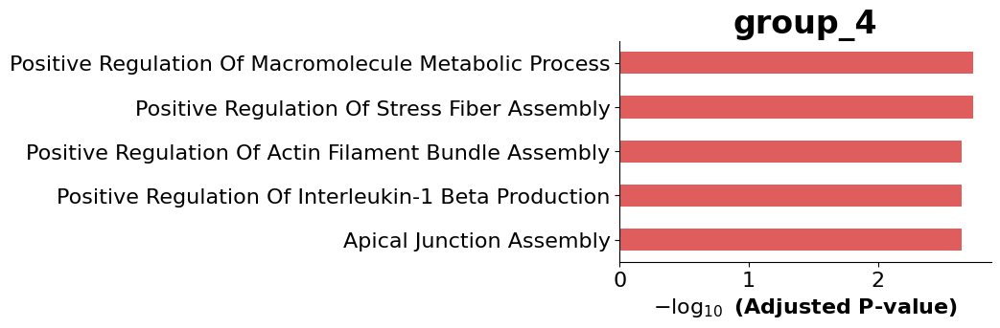

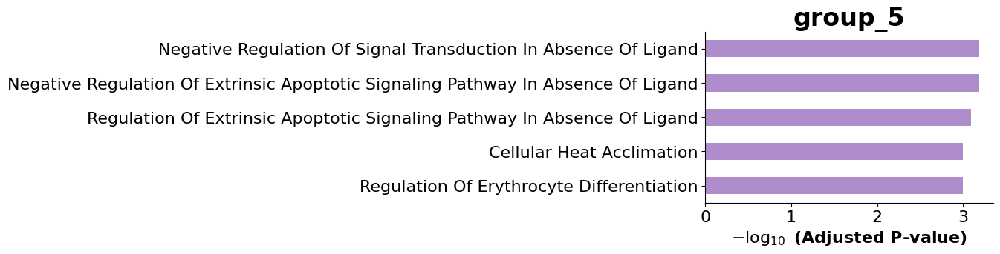

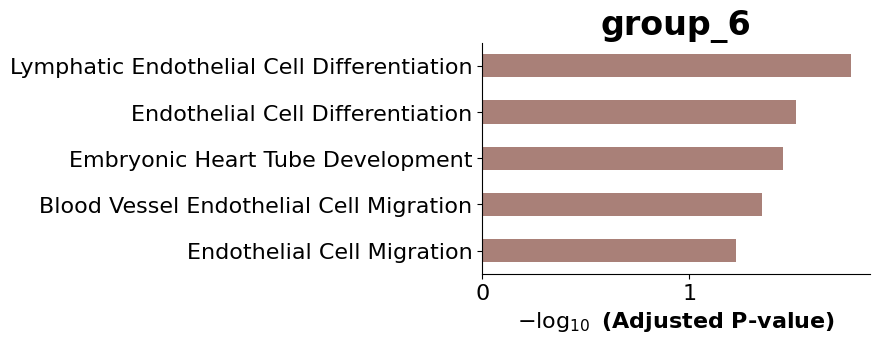

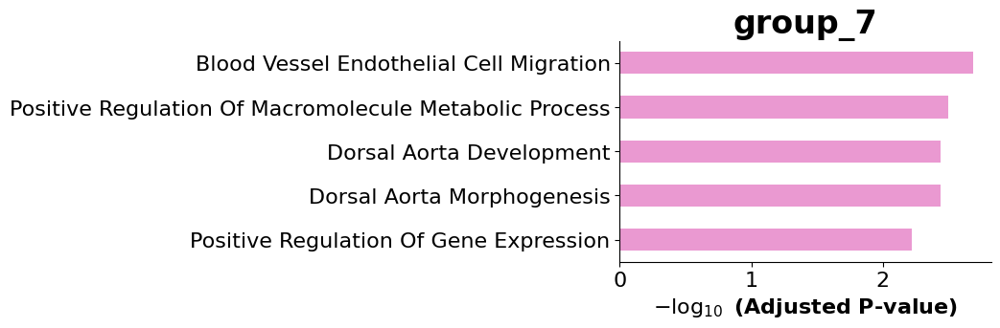

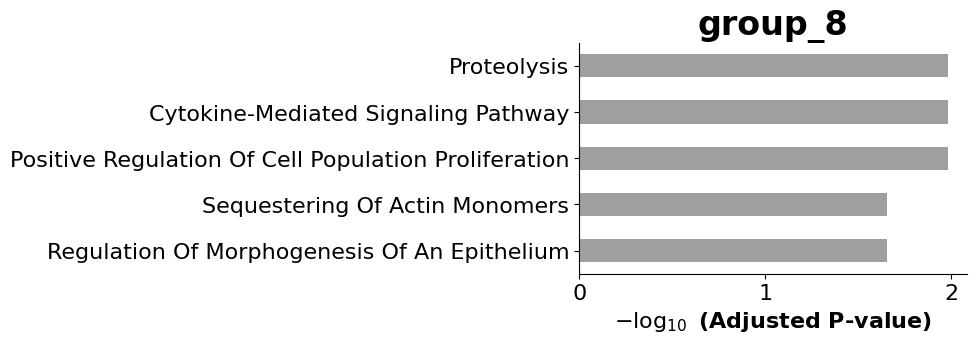

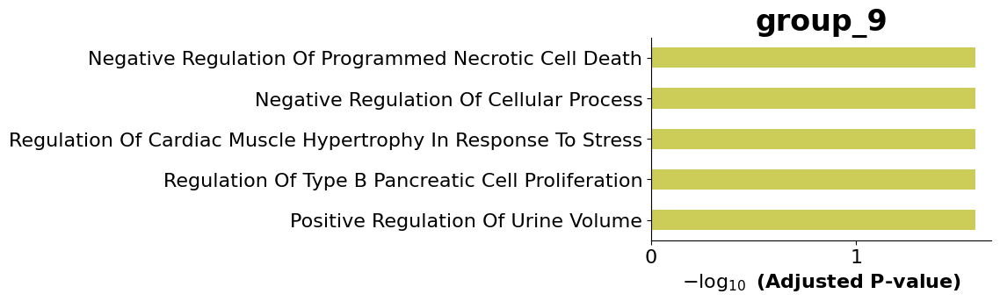

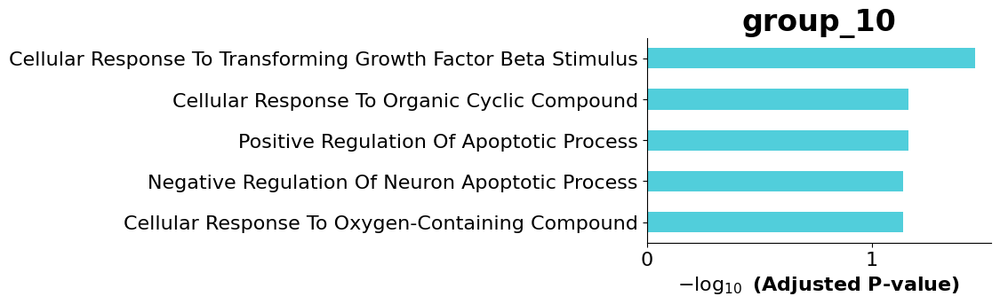

In [92]:
import matplotlib.colors as mcolors
hex_colors = [mcolors.rgb2hex(color) for color in palette]

for i in range(1,11):
    enr = gp.enrichr(list(clustered_df_smoothed.index[row_clusters==i]),
                    gene_sets='GO_Biological_Process_2023',
                    outdir=None)
    enr.res2d.Term = enr.res2d.Term.str.split(" \(GO").str[0]
    gp.barplot(enr.res2d, title=f"group_{i}", top_term=5, figsize=(5,3),cutoff=0.1,color=hex_colors[i-1])
    plt.savefig(f"figures/group_{i}_colored.pdf")